In [2]:
# Basic imports
import numpy as np

# CHIMES IMPORTATION
import sys
sys.path.insert(0, '../../')
import chimes as chm


In [2]:
# IMPROVING THE DISPLAY (OPTIONAL) ##############################
# Better display of tables
import pandas as pd
pd.set_option('display.max_colwidth', None)
pd.set_option("display.colheader_justify","left")

# Interactive tables 
from itables import init_notebook_mode,options
options.columnDefs = [{"className": "dt-left", "targets": "_all"}]
options.classes="display nowrap compact"
options.scrollY="400px"
options.scrollCollapse=True
options.paging=False
init_notebook_mode(all_interactive=True)

# traditional display for ipython
from IPython.display import display,HTML,Markdown
from IPython.display import IFrame

# Better display of plots: latex encoding in plotly
%matplotlib widget
import plotly
plotly.offline.init_notebook_mode()
display(HTML('<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'))



<IPython.core.display.Javascript object>

## CHIMES parrallelisation effectiveness

one of CHIMES strength is its ability to do multiple runs in parrallel at very low additional costs, as illustrated below. 

In [3]:
import time 
for nx in [1,10,100,1000,10000]:
    hub=chm.Hub('GK',verb=False)
    hub.set_fields(nx=nx,verb=False)
    t1=time.time()
    hub.run(verb=0)
    print(f'Time took for {nx} systems in parrallel: {(time.time()-t1):.4f} seconds')

Time took for 1 systems in parrallel: 0.2905 seconds
Time took for 10 systems in parrallel: 0.2978 seconds
Time took for 100 systems in parrallel: 0.4072 seconds
Time took for 1000 systems in parrallel: 0.8249 seconds
Time took for 10000 systems in parrallel: 5.3870 seconds


## CHIMES distribution generation

In consequence, running not one system but a lot of system in parrallel with distributions of values instead of one. CHIMES integrate distribution generation in a pratical format, with `chm.generate_dic_distribution`. 

In [4]:
chm.generate_dic_distribution?

Signature:
chm.generate_dic_distribution(
    InputDic: dict[str, dict],
    dictpreset={},
    N=10,
) -> dict[slice(<class 'str'>, <class 'numpy.ndarray'>, None)]
Docstring:
Generate N monte-carlo sampled values in random distributions for each key of the InputDic.

The characteristics for each distributions is in each dictionary.
The output of the function can be used as input for as `set.dfields(**output)`.

Parameters
----------
InputDic : dict
    A dictionary where each key corresponds to a field name and each value is another dictionary 
    containing the parameters for the distribution of that field.
dictpreset : dict, optional
    A dictionary where you want to add the distribution values. Default is an empty dictionary.
N : int, optional
    The number of sampled values in each distributions. Default is 10.

Returns
-------
dict
    The updated dictionary with the generated distribution values for each field.

Notes
-----
For each field in InputDic, the function calls _Gene

In [5]:
Tests = {'log': {'mu': .5,
                'sigma': .7,
                'type': 'log'},
        'lognormal': {'mu': .2,
                    'sigma': .12,
                    'type': 'lognormal'},
        'log-normal': {'mu': .7,
                    'sigma': .25,
                    'type': 'log-normal'},
        'normal': {'mu': .2,
                'sigma': .12,
                'type': 'normal'},
        'gaussian': {'mu': .2,
                    'sigma': .12,
                    'type': 'gaussian'},
        'uniform': {'mu': .2,
                    'sigma': .25,
                    'type': 'uniform'}, }
data = chm.generate_dic_distribution(Tests, N=1000)

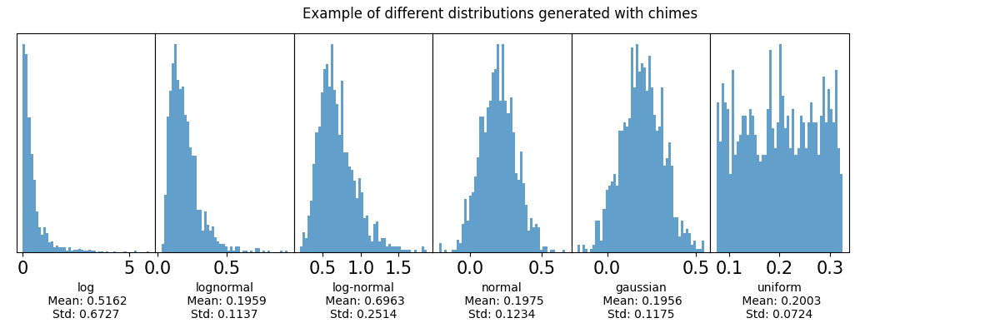

In [6]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))

for i, (key, values) in enumerate({k:v for k,v in data.items() if k!='nx'}.items(), 1):
        # Plot histogram
        plt.subplot(1,len(data), i)
        plt.hist(values, bins=50, alpha=0.7)
        
        mean_val = np.mean(values)
        std_val = np.std(values)
        plt.xlabel(f"{key}\n Mean: {mean_val:.4f}\nStd: {std_val:.4f}")
        plt.yticks([])

# Adjust layout
plt.tight_layout()
plt.suptitle('Example of different distributions generated with chimes\n\n' )
plt.subplots_adjust(top=0.9,wspace=0)
# Show plot
plt.show()

Those values can easily be used as input of CHIMES

time step 1000 / 1000
The system is calculating sensitivity...
Done


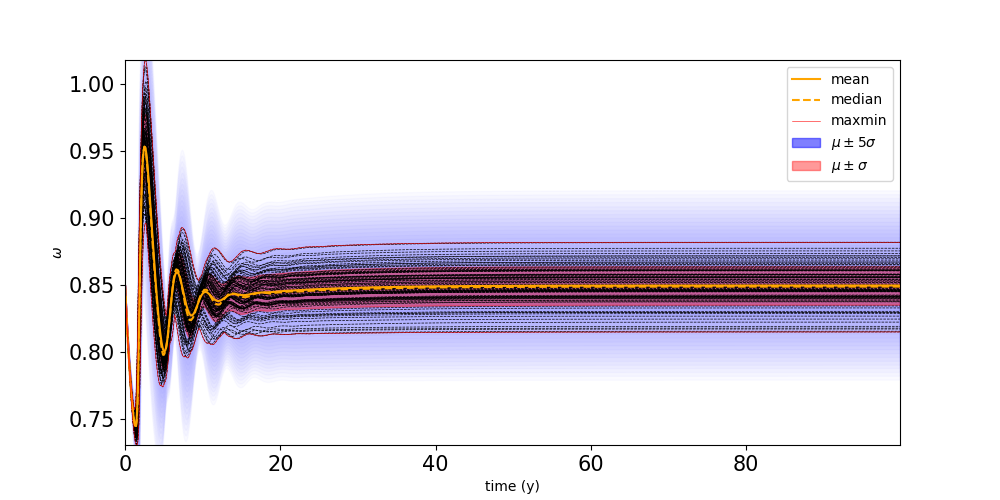

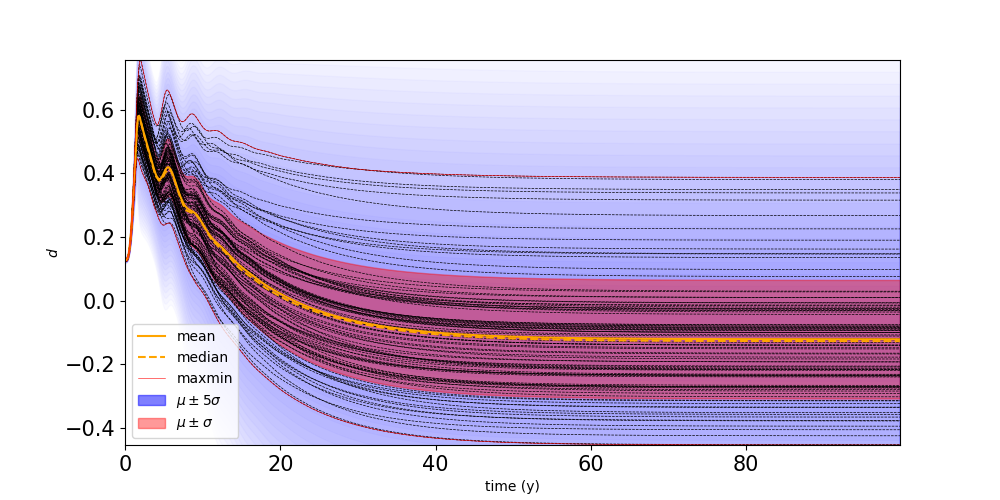

In [7]:
hub=chm.Hub('GK')

### Replace values by distributions of mean "mu", standard deviation "sigma" and type of distribution "lognormal"
input = dict(alpha={'mu': 0.02,
                'sigma': .005,
                'type': 'log'},
         n={'mu': 0.025,
                'sigma': .01,
                'type': 'log'},
         nu={'mu':3,
                'sigma': .05,
                'type': 'log'},
       )
distribs = chm.generate_dic_distribution(input,N=100) # Create the distributions on 100 points
hub.set_fields(**distribs) # Set the distributions into the model 
hub.run() # Run the system with the distributions

chm.Plots.Var(hub,'omega',mode='sensitivity') # display the different simulations of the variable omega (wage share)
chm.Plots.Var(hub,'d',mode='sensitivity') # display the different simulations of the variable omega (debt ratio)

chm.Plots.nyaxis(hub,[['omega','employment'],['d']])

## Uncertainty

When we run a model, we do it with specific values of parameters and initial conditions. Typically, those values are calibrated or deduced from a real situation. However, the evaluation can carry uncertainty of measure. How is this uncertainty of measure impacting the rest of the system ? 
`run_uncertainty` will generate a distribution for each parameter and initial condition, with as a mean value the one actually in the system, and a standard deviation of x% around of this value. This of course only work if you just have no system in parrallel already. 

It is a very good tool to verify if your simulation is real


time step 500 / 500


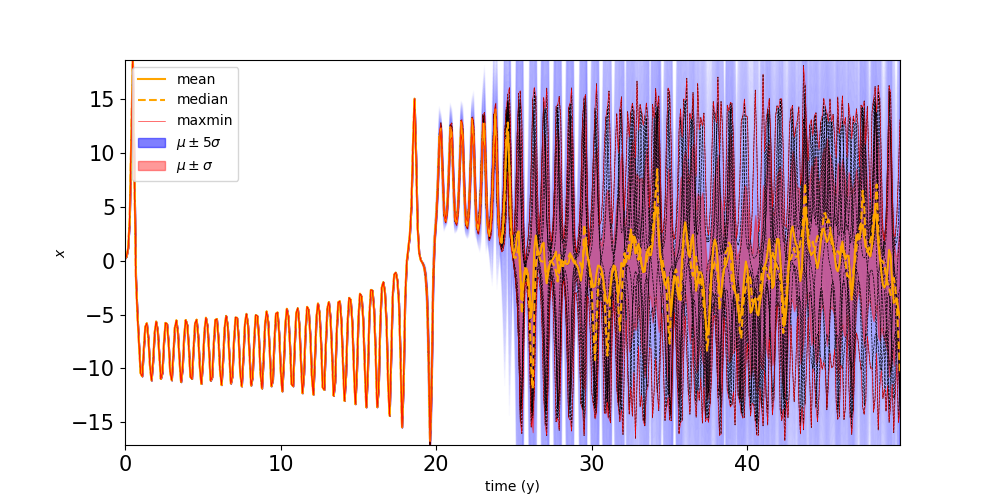

In [9]:
hub=chm.Hub('Lorenz_Attractor')
hub.set_fields(Tsim=50)
hub.run_uncertainty(0.001,N=10) # Run with 1% of uncertainty and 10 simulations
chm.Plots.Var(hub,'x',mode='sensitivity') 
chm.Plots.nyaxis(hub,[['x'],['z']])

### Uncertainty and presets 

Such approach also work with a preset values, you just have to run it with uncertainty rather than the traditional run

time step 1200 / 1200


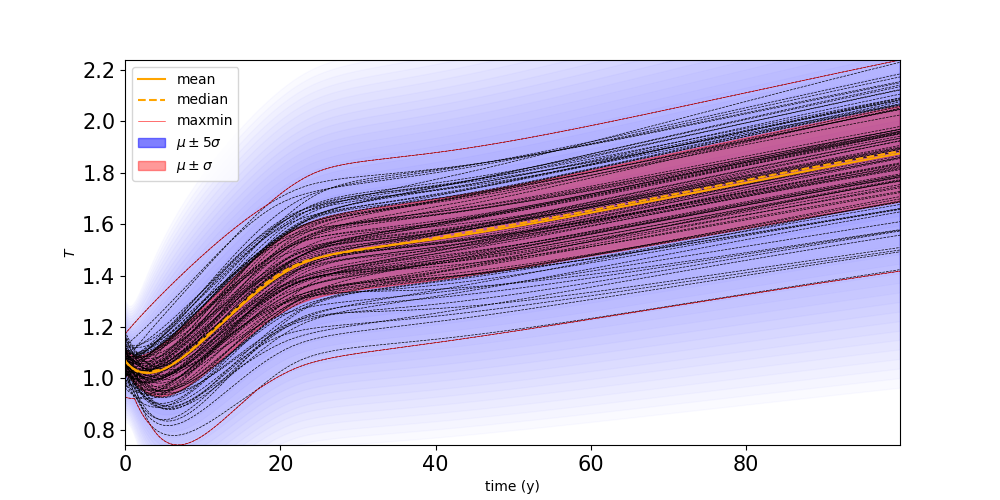

In [11]:
hub=chm.Hub('GEMMES_Coping2018',preset='TRANSITION') # Preset of a transition dynamics for an economy-climate transition
hub.run_uncertainty(5,N=100)  # Run with 5% of uncertainty and 100 simulations
chm.Plots.Var(hub,'T',mode='sensitivity') # display the different simulations of the variable T (temperature)
chm.Plots.nyaxis(hub,[['omega'],['d']])

## Sensitivity
If we now that the system is sensitive to the input values in general, it is important to know which values affects the most the dynamics, and either refine this area of the model (endogenization, substitution of logics) or impro

Sensitivity analysis is the study of how the uncertainty in the output of a mathematical model or system (numerical or otherwise) can be divided and allocated to different sources of uncertainty in its inputs.
Typically, what happens to `Y` if we move `X` by a few percent ? As we are dealing with complex systems, everything can be connected to everything, and makes such task daunting. 

`hub.calculate_sensitivity` Will :
* Create one clone of your hub per field it's going to make vary (typically, one per parameter and one per differential variable + one for each at the same time)
* Replace the field value by a distribution for each clone
* Run each clone, then do statistical analyses on the trajectory

The output is a dictionnary with each Hub. It is recommended to use it directly as the input of `chm.Plots.Showsensitivity`.

In [62]:
help(hub.calculate_sensitivity)

Help on method sensitivity in module chimes._core_functions._calculate_methods:

sensitivity(keys='__ALL__', std=0.01, stdmode='relative', distribution: str = 'lognormal', N: int = 10, combined_run=True, Noutput=500, verb: bool = False) -> dict method of chimes._core.Hub instance
    Computes runs in parallel, with parameter/initial values taken from a distribution. 
    The distributions are centered around the hub values, with their width controlled by `std`.
    The output is a dictionary of Hub, the key being the field that is taken in its distribution. 
    
    Parameters
    ----------
    keys : str or list or tuple or dict, optional
        All fields (parameters/differential) that are going to have a distribution associated to their value. 
        If `__ALL__`, all fields are covered. If key is a list of str, all the fields inside are included. 
        If key is a tuple of str, all the fields inside are excluded. 
        If keys is a dictionary with numerical values, the v

In [13]:
hub=chm.Hub('GK',preset='debtstabilisation',verb=False)
hub.set_fields(eta=0.1)
hub.set_fields(Tsim=80)

# By default run the sensitivity analysis with a standard deviation of 1% on all parameters
OUT = hub.calculate_sensitivity(
    std=0.01, # Sensitivity analysis with a standard deviation of 1% on all parameters
)


$x \to x*(1+ \sigma)$

In [75]:
chm.Plots.nyaxis(OUT['_COMBINED_'],[['omega','employment'],['d']])

In [66]:
#Show the type of the output 
for key, value in OUT.items():
    print(f'{key}: {type(value)}')

_COMBINED_: <class 'chimes._core.Hub'>
a: <class 'chimes._core.Hub'>
N: <class 'chimes._core.Hub'>
K: <class 'chimes._core.Hub'>
w: <class 'chimes._core.Hub'>
p: <class 'chimes._core.Hub'>
D: <class 'chimes._core.Hub'>
Dh: <class 'chimes._core.Hub'>
Delta: <class 'chimes._core.Hub'>
alpha: <class 'chimes._core.Hub'>
n: <class 'chimes._core.Hub'>
delta: <class 'chimes._core.Hub'>
r: <class 'chimes._core.Hub'>
nu: <class 'chimes._core.Hub'>
eta: <class 'chimes._core.Hub'>
mu: <class 'chimes._core.Hub'>
k0: <class 'chimes._core.Hub'>
k1: <class 'chimes._core.Hub'>
k2: <class 'chimes._core.Hub'>
phinull: <class 'chimes._core.Hub'>


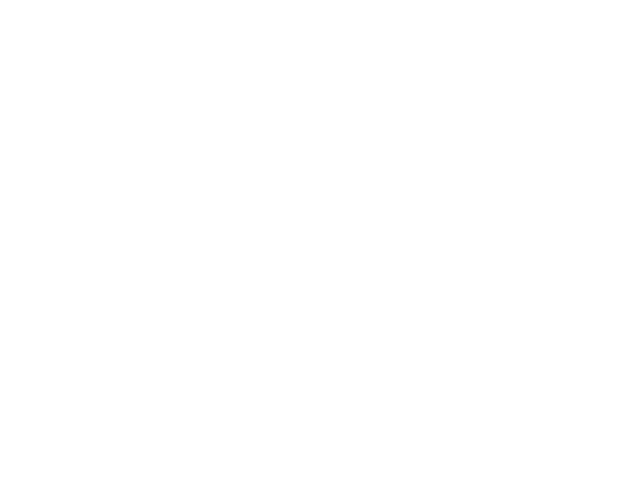

In [14]:
chm.Plots.Showsensitivity(OUT,['omega','d','Y']) # Show the output of the sensitivity analysis for the variables omega, d, Y

### Screening 

If you have a model which is too big, you can typically: 
* reduce the number of keys, by adding a list of the input that will be impacted. 
* Change the number of system in parrallel `N`
* add specific standard deviation for each variable. to do set, key = { key1:std1,... } and put no std input in the function. Note that in this case it is not a sensiitivity analysis specifically as the relative impact is weighted, it is more a quantitative measurement of individual uncertainty
* change distribution type. By default, it is using lognormal (conserve the sign, more logical in % of variation)
* only consider the impact of each elements together (as an uncertainty run) or separate, using `combined_run = 'independant'` ,`'additive'` or `True` (for both)
* Reduce the output size if it's taking too much memory through `Noutput`

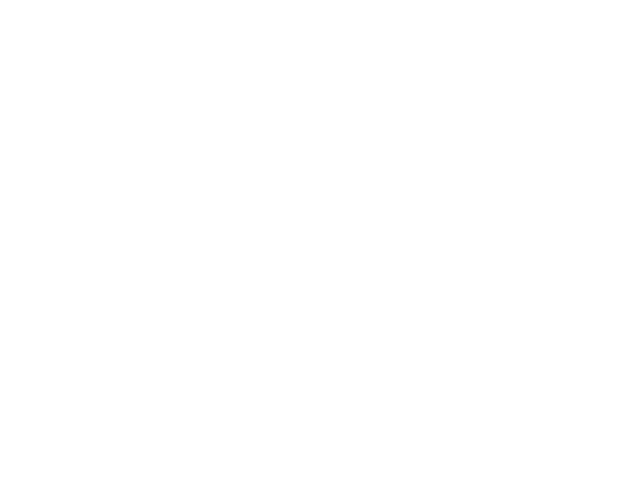

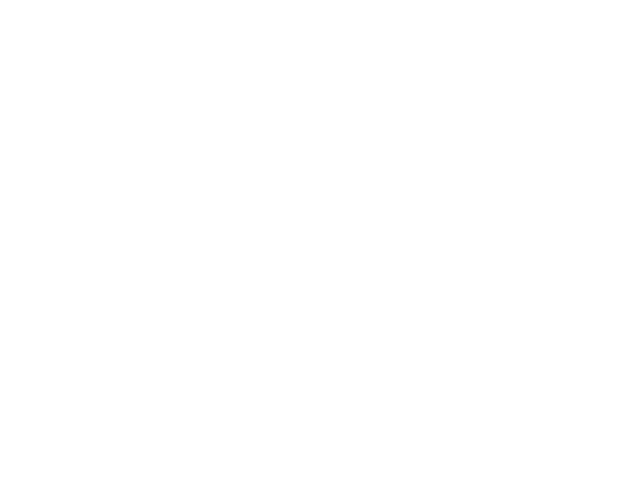

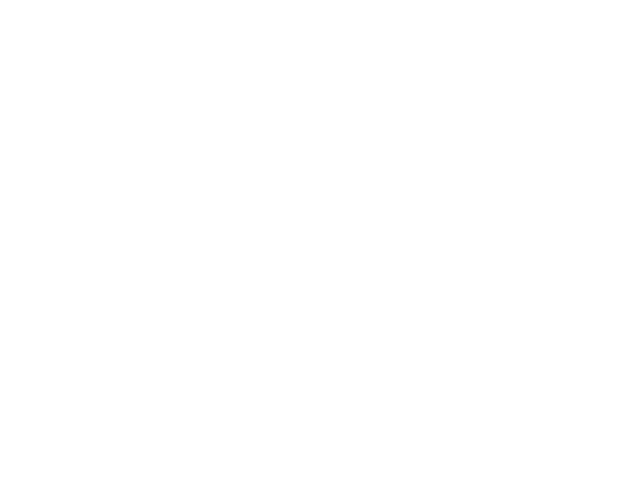

In [12]:
hub=chm.Hub('GK',preset='debtstabilisation',verb=False)
hub.set_fields(eta=0.1)
# Only look at the sensitivity of the parameters alpha, n, nu and k0, with different variation
OUT = hub.calculate_sensitivity(
    keys = {'alpha':0.01, 'n':0.03, 'nu':0.05,'k1':0.01, 'k2':0.05}, 
    combined_run='independant',
    N = 50,
    Noutput=100 
)
chm.Plots.Showsensitivity(OUT,['omega','employment','d']) # Show the output of the sensitivity analysis for the variables omega, d, Y